In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 96), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  636.33 2.991 0.312349


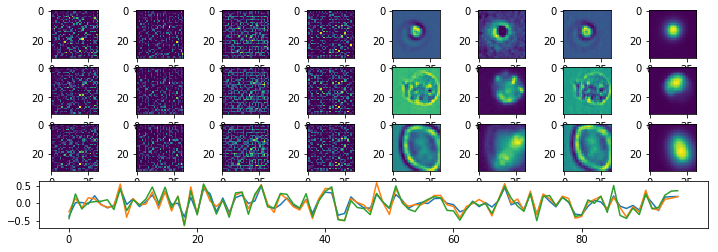

Epoch:  1 Iteration:  0 Loss:  17.3004 0.637302 0.00137758


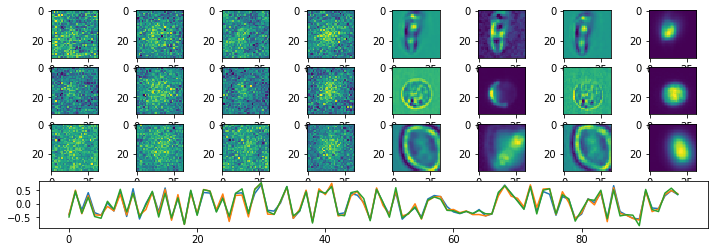

Epoch:  2 Iteration:  0 Loss:  15.2195 0.636151 0.00272956


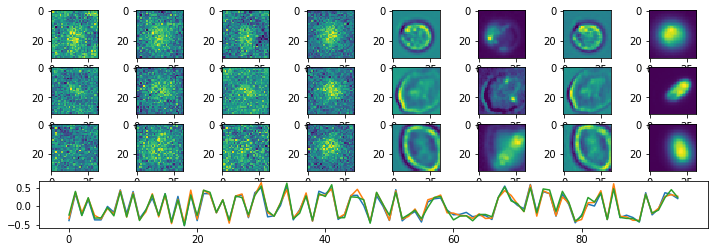

Epoch:  3 Iteration:  0 Loss:  13.512 0.635216 0.00239953


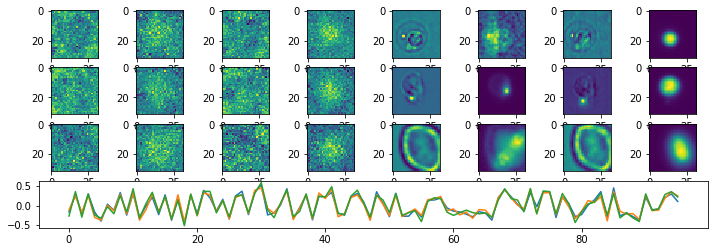

Epoch:  4 Iteration:  0 Loss:  14.8222 0.635944 0.00325799


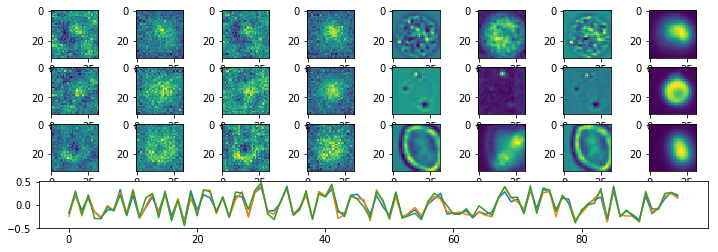

Epoch:  5 Iteration:  0 Loss:  11.5148 0.634179 0.00152734


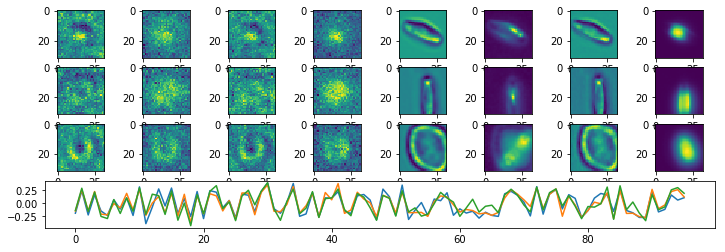

Epoch:  6 Iteration:  0 Loss:  10.7532 0.633793 0.001358


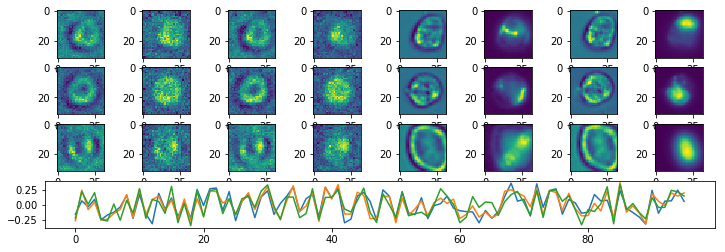

Epoch:  7 Iteration:  0 Loss:  11.494 0.634206 0.00285926


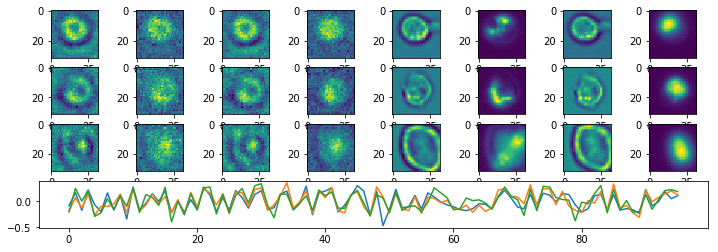

Epoch:  8 Iteration:  0 Loss:  9.08872 0.632913 0.000981718


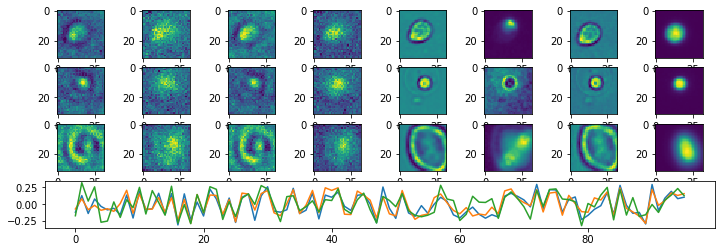

Epoch:  9 Iteration:  0 Loss:  8.24139 0.632474 0.00164697


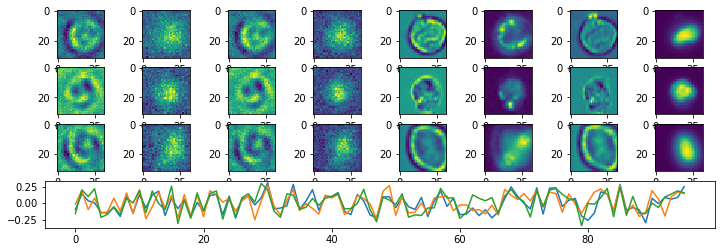

Epoch:  10 Iteration:  0 Loss:  7.82622 0.632258 0.00125366


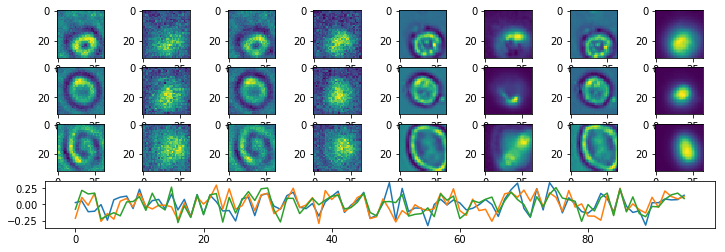

Epoch:  11 Iteration:  0 Loss:  7.58512 0.632131 0.00191826


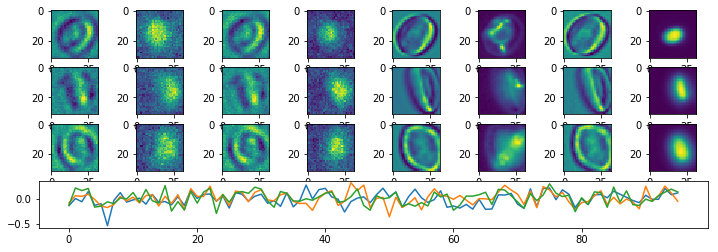

Epoch:  12 Iteration:  0 Loss:  7.10449 0.631883 0.00113475


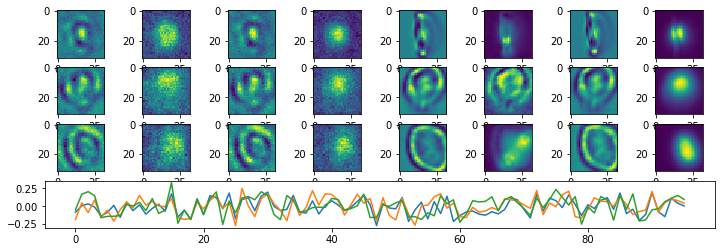

Epoch:  13 Iteration:  0 Loss:  6.83276 0.631739 0.00130799


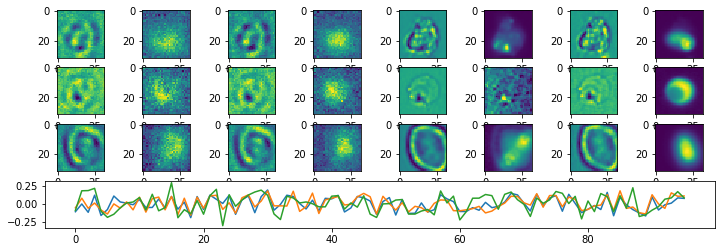

Epoch:  14 Iteration:  0 Loss:  6.60803 0.631623 0.00135118


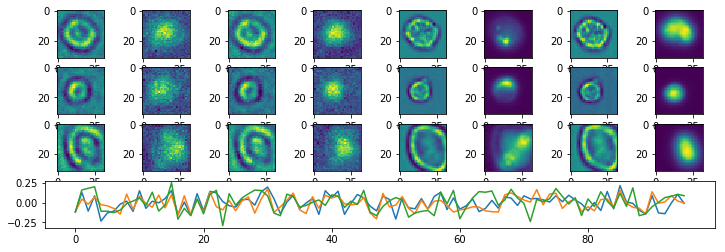

Epoch:  15 Iteration:  0 Loss:  6.45469 0.631541 0.00071919


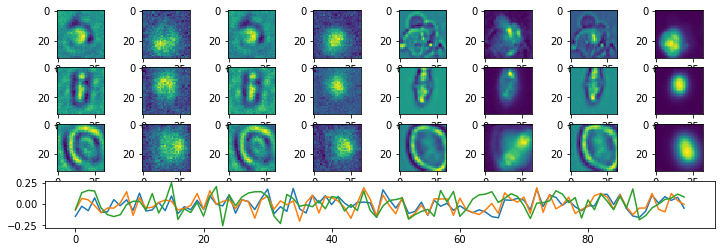

Epoch:  16 Iteration:  0 Loss:  6.2168 0.631419 0.00114673


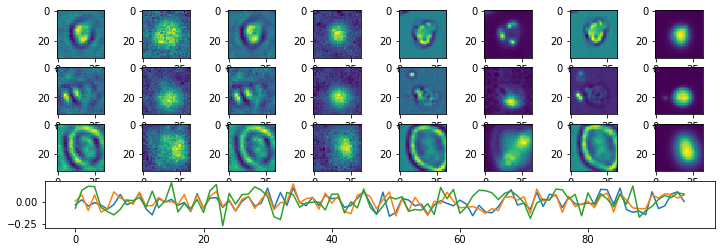

Epoch:  17 Iteration:  0 Loss:  6.01888 0.631317 0.000961661


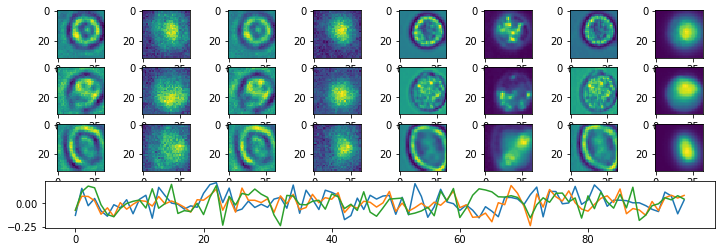

Epoch:  18 Iteration:  0 Loss:  5.93239 0.631273 0.00108644


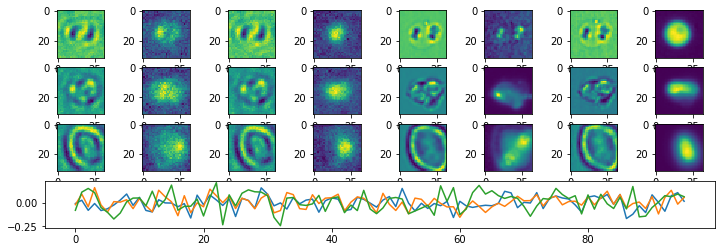

Epoch:  19 Iteration:  0 Loss:  5.75976 0.631182 0.000927925


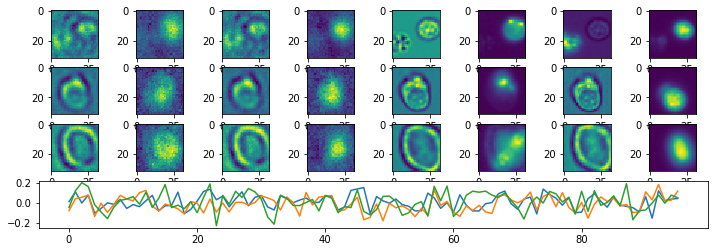

Epoch:  20 Iteration:  0 Loss:  5.66521 0.631134 0.000483721


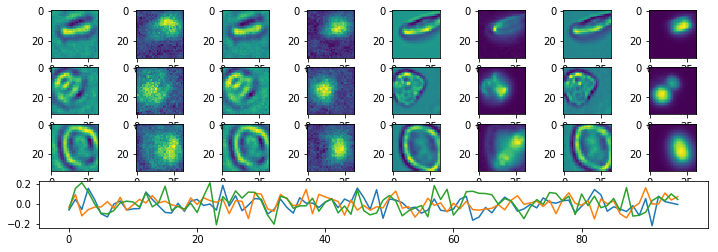

Epoch:  21 Iteration:  0 Loss:  5.49914 0.631045 0.000801563


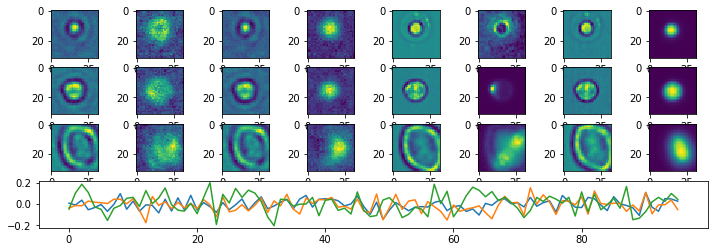

Epoch:  22 Iteration:  0 Loss:  5.3976 0.630993 0.000926733


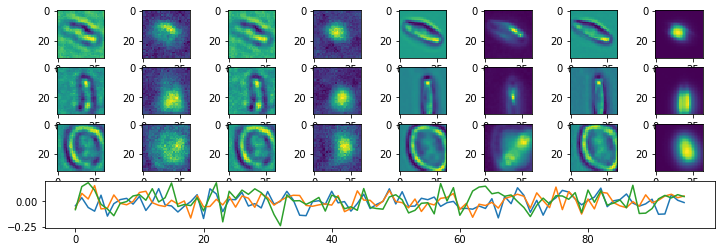

Epoch:  23 Iteration:  0 Loss:  5.23749 0.630907 0.000757992


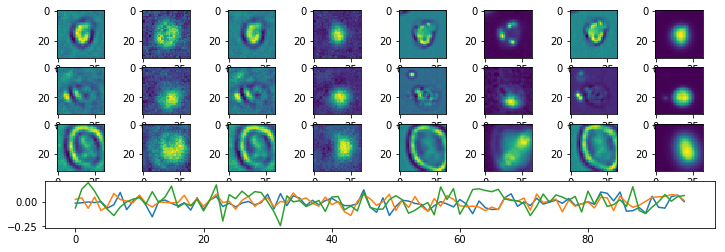

Epoch:  24 Iteration:  0 Loss:  5.12679 0.630846 0.000592738


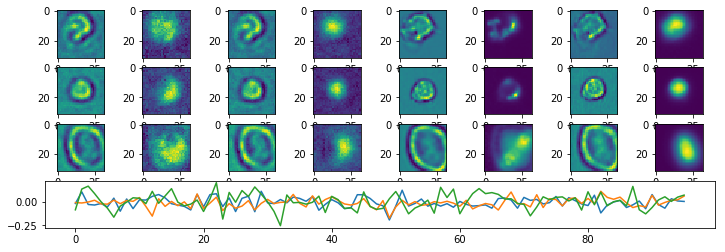

Epoch:  25 Iteration:  0 Loss:  5.00699 0.630782 0.00043416


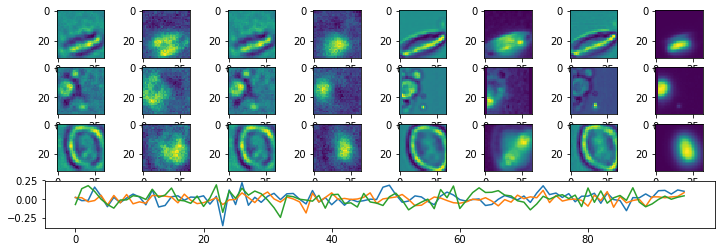

Epoch:  26 Iteration:  0 Loss:  4.92535 0.630737 0.000515431


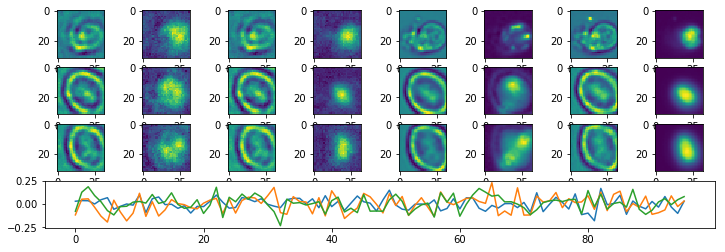

Epoch:  27 Iteration:  0 Loss:  4.87119 0.630708 0.00105602


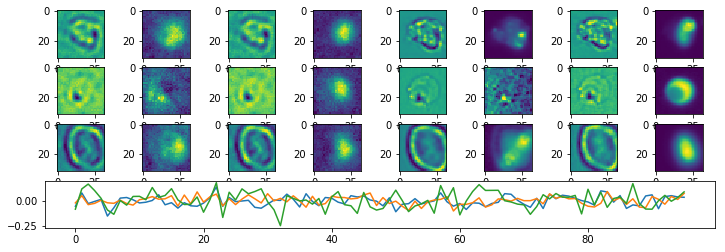

Epoch:  28 Iteration:  0 Loss:  4.75399 0.630646 0.00113702


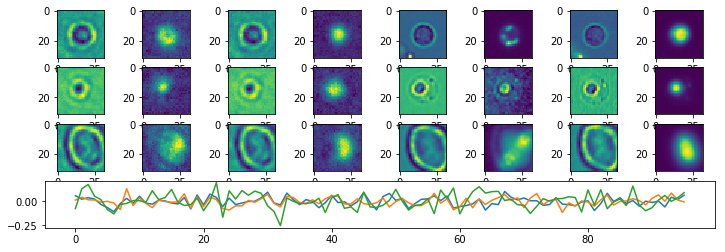

Epoch:  29 Iteration:  0 Loss:  4.63394 0.630584 0.000671774


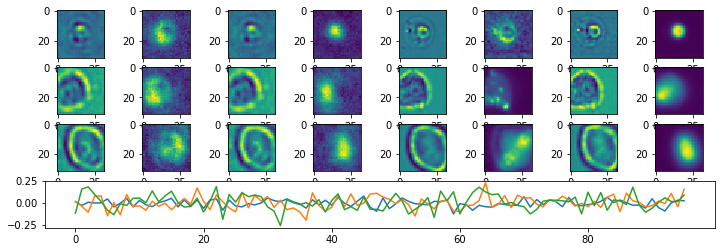

Epoch:  30 Iteration:  0 Loss:  4.62978 0.630583 0.000774175


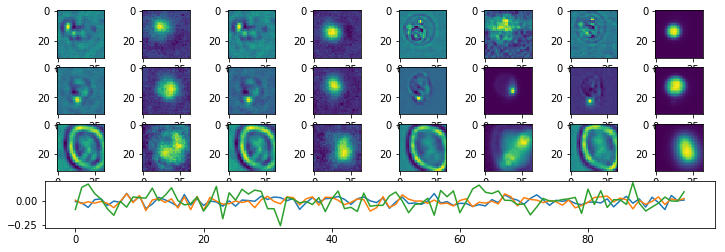

Epoch:  31 Iteration:  0 Loss:  4.55141 0.63054 0.000936121


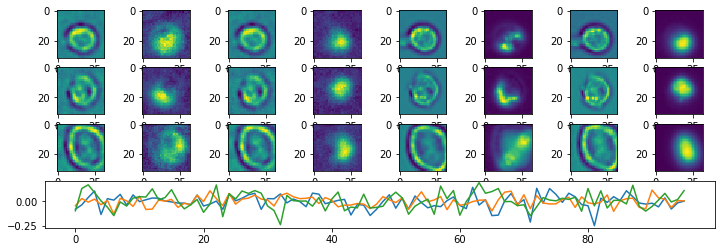

Epoch:  32 Iteration:  0 Loss:  4.45222 0.630488 0.000960112


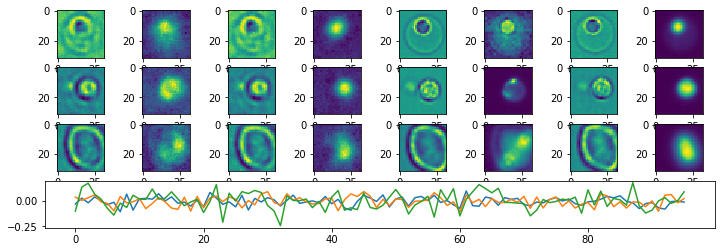

Epoch:  33 Iteration:  0 Loss:  4.38877 0.630453 0.00084728


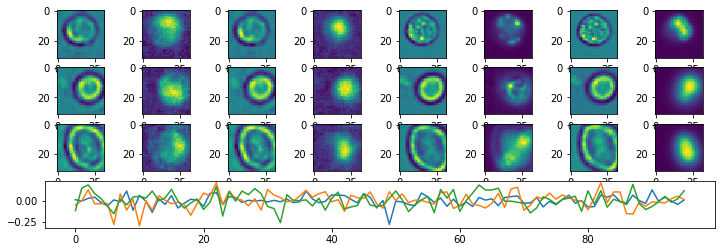

Epoch:  34 Iteration:  0 Loss:  4.36551 0.630442 0.000641555


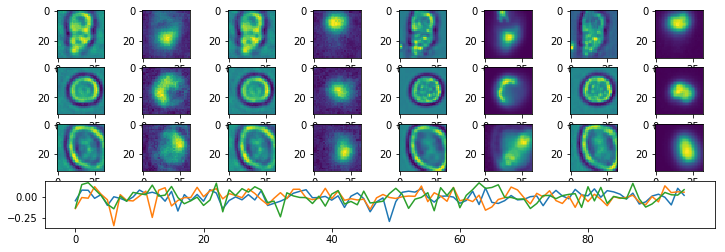

Epoch:  35 Iteration:  0 Loss:  4.32277 0.63042 0.000804096


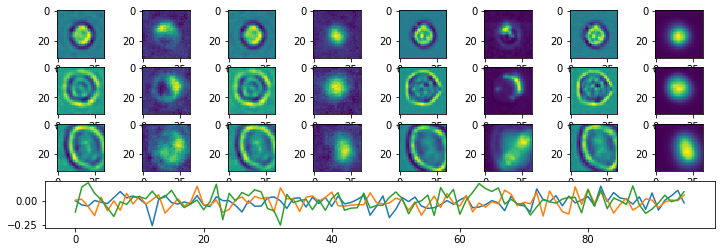

Epoch:  36 Iteration:  0 Loss:  4.25327 0.630384 0.000684619


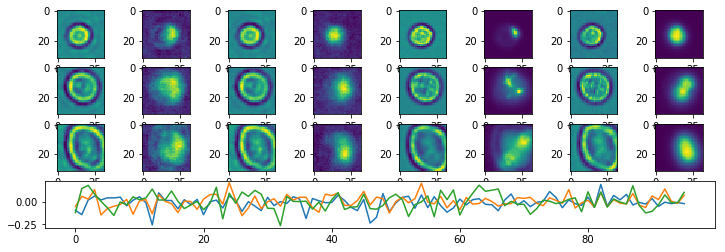

Epoch:  37 Iteration:  0 Loss:  4.20912 0.63036 0.000727862


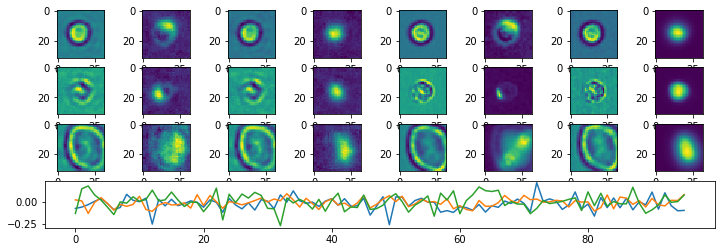

Epoch:  38 Iteration:  0 Loss:  4.19086 0.63035 0.000364423


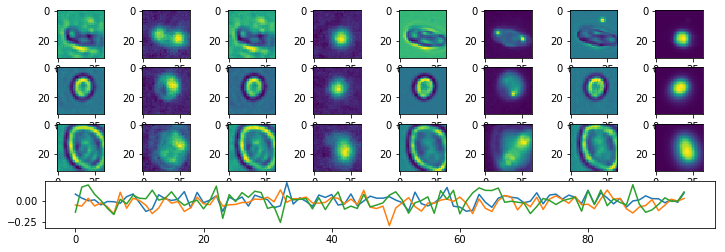

Epoch:  39 Iteration:  0 Loss:  4.16578 0.630336 0.000292689


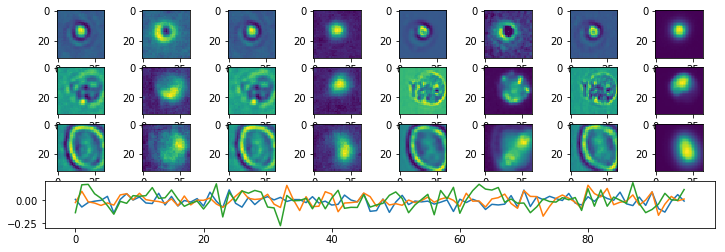

Epoch:  40 Iteration:  0 Loss:  4.10554 0.630307 0.000499636


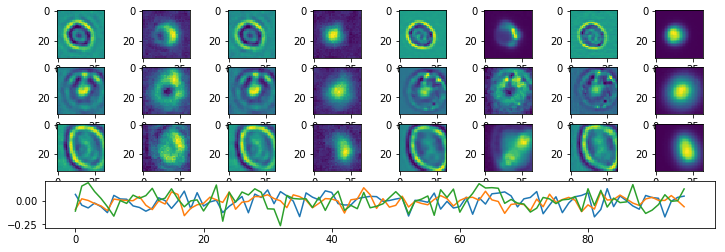

Epoch:  41 Iteration:  0 Loss:  4.06892 0.630286 0.000577539


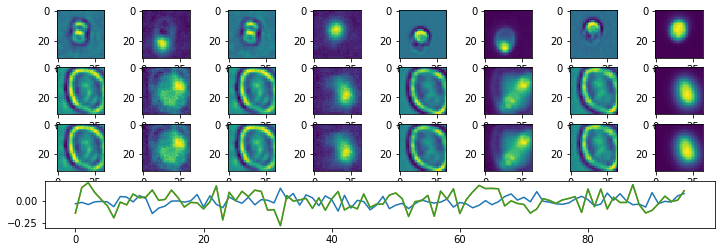

Epoch:  42 Iteration:  0 Loss:  3.99606 0.63025 0.000663817


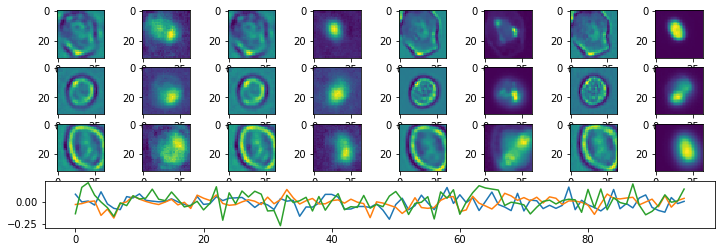

Epoch:  43 Iteration:  0 Loss:  3.98628 0.630244 0.000670612


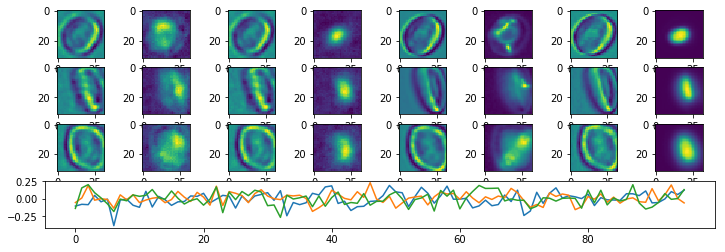

Epoch:  44 Iteration:  0 Loss:  3.93789 0.630221 0.000200003


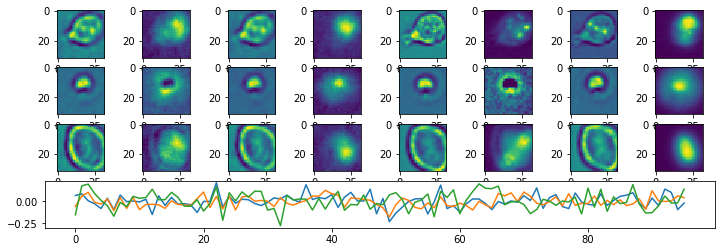

Epoch:  45 Iteration:  0 Loss:  3.91734 0.630213 0.000609845


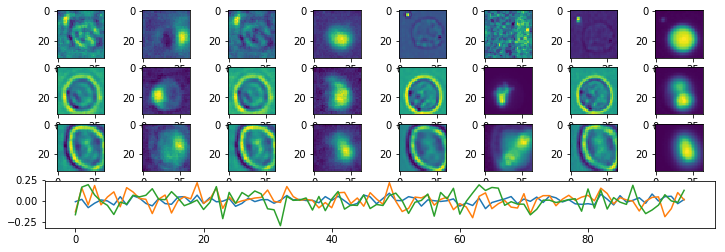

Epoch:  46 Iteration:  0 Loss:  3.93804 0.630218 0.00102261


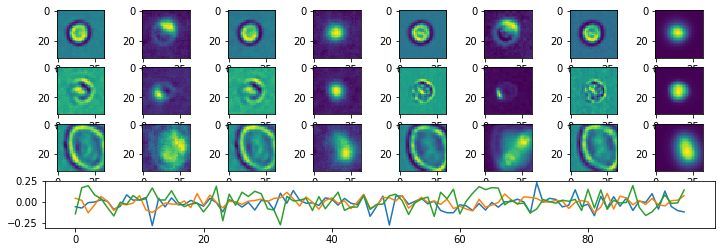

Epoch:  47 Iteration:  0 Loss:  3.92701 0.630215 0.000622481


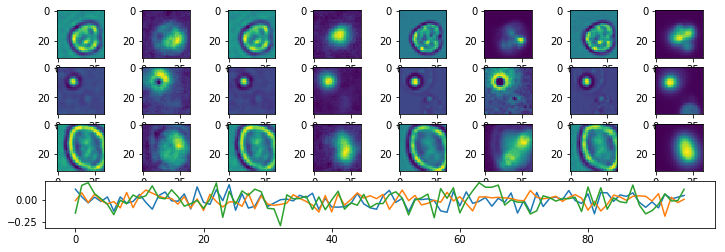

Epoch:  48 Iteration:  0 Loss:  3.82863 0.630162 0.000700504


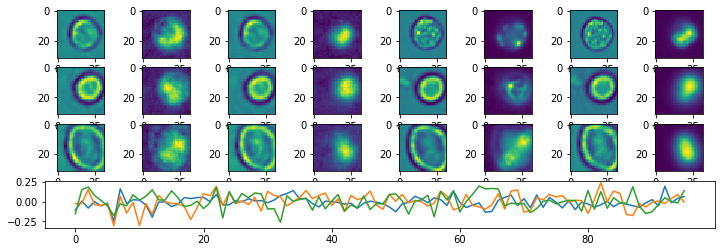

Epoch:  49 Iteration:  0 Loss:  3.81937 0.630158 0.000591636


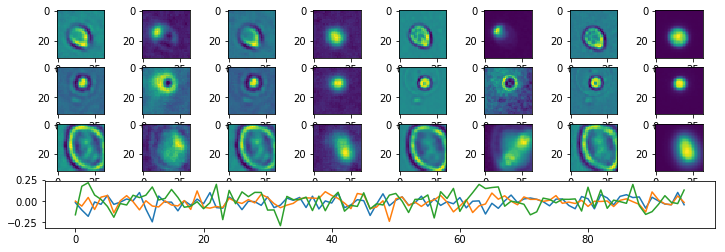

Epoch:  50 Iteration:  0 Loss:  3.78007 0.630136 0.000654697


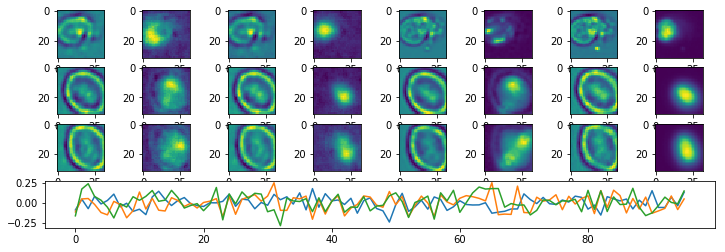

Epoch:  51 Iteration:  0 Loss:  3.77305 0.630133 0.000789106


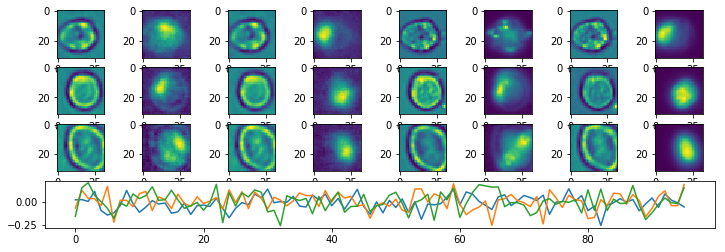

Epoch:  52 Iteration:  0 Loss:  3.73553 0.630114 0.000842541


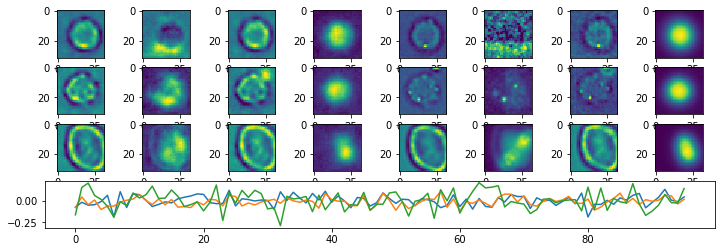

Epoch:  53 Iteration:  0 Loss:  3.7269 0.630109 0.000425726


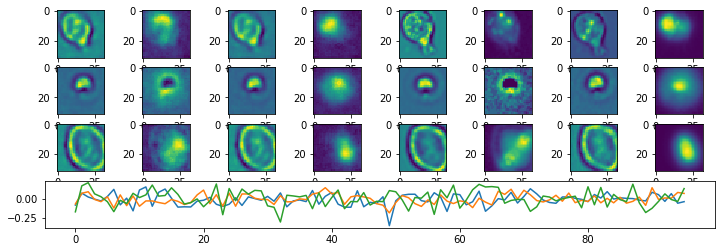

Epoch:  54 Iteration:  0 Loss:  3.69091 0.63009 0.000481427


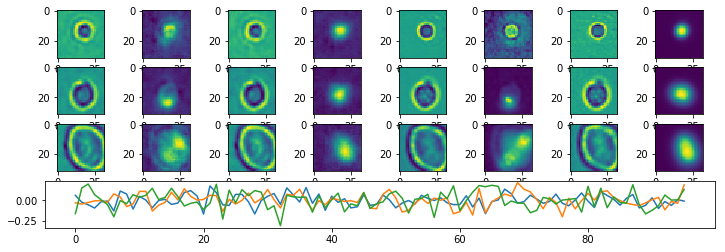

Epoch:  55 Iteration:  0 Loss:  3.6828 0.630088 0.000705481


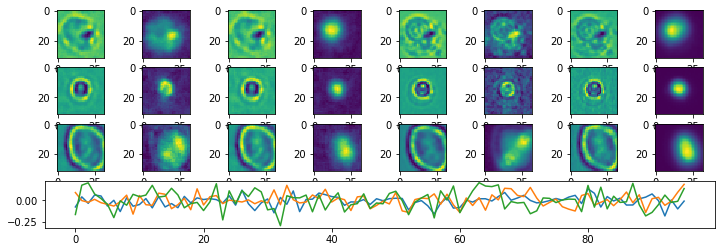

Epoch:  56 Iteration:  0 Loss:  3.69866 0.630094 0.000600427


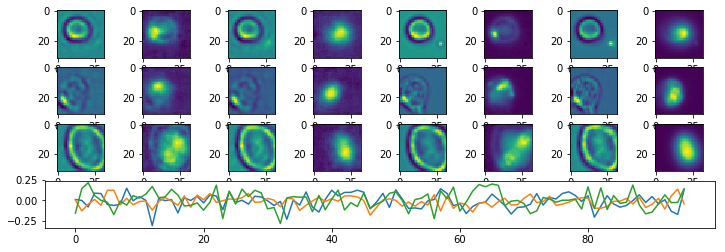

Epoch:  57 Iteration:  0 Loss:  3.66689 0.630078 0.000572294


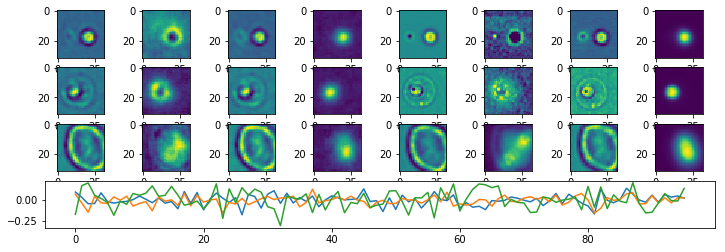

Epoch:  58 Iteration:  0 Loss:  3.6243 0.630056 0.000308126


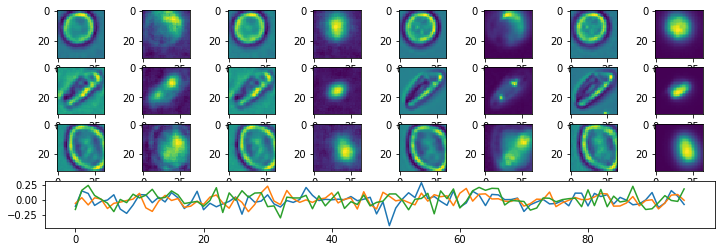

Epoch:  59 Iteration:  0 Loss:  3.60199 0.630044 0.000560433


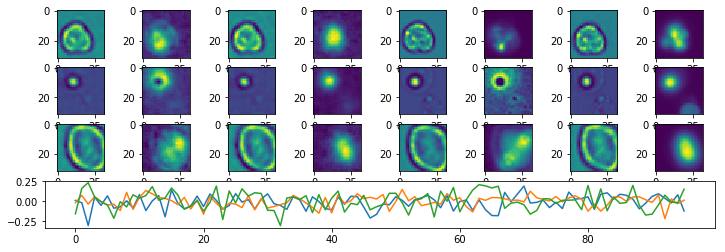

Epoch:  60 Iteration:  0 Loss:  3.62031 0.630053 0.00066641


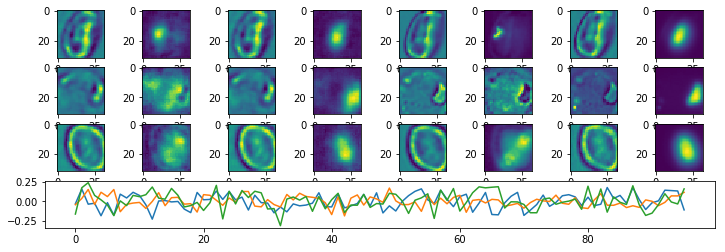

Epoch:  61 Iteration:  0 Loss:  3.58584 0.630036 0.000517935


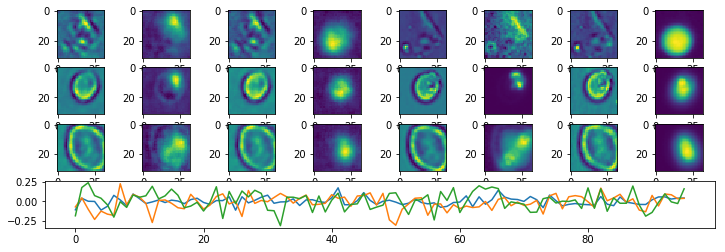

Epoch:  62 Iteration:  0 Loss:  3.56181 0.630024 0.000448287


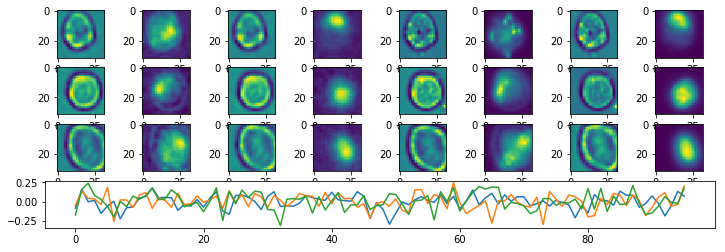

Epoch:  63 Iteration:  0 Loss:  3.53975 0.630012 0.000607818


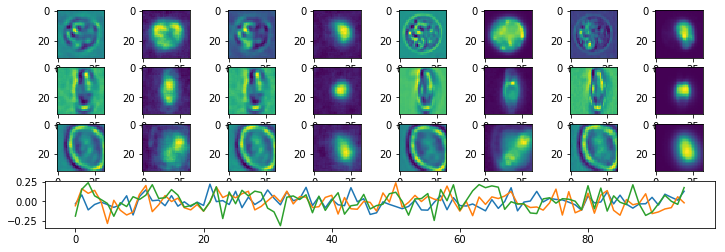

Epoch:  64 Iteration:  0 Loss:  3.53092 0.630007 0.000330091


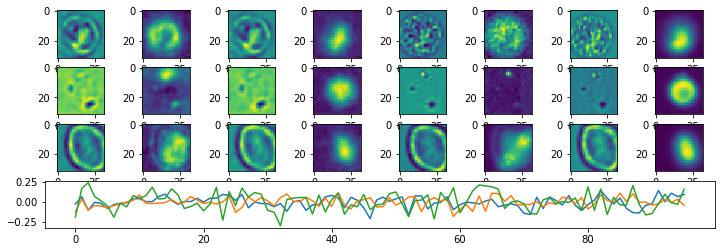

Epoch:  65 Iteration:  0 Loss:  3.55974 0.630022 0.000698596


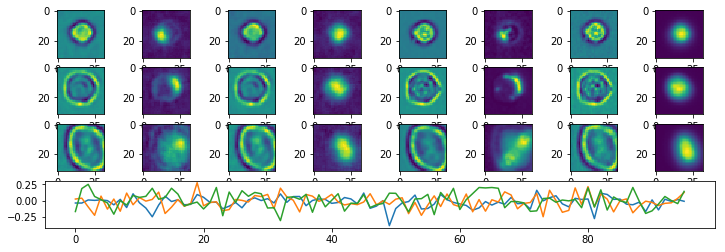

Epoch:  66 Iteration:  0 Loss:  3.51081 0.629998 0.000424147


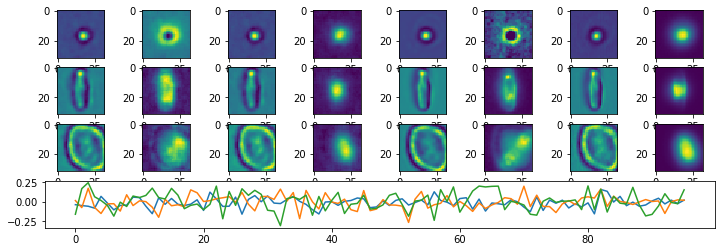

Epoch:  67 Iteration:  0 Loss:  3.48274 0.629982 0.000566065


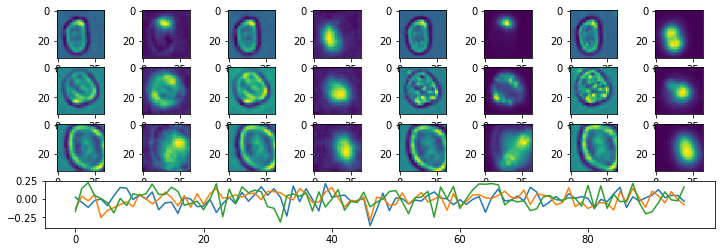

Epoch:  68 Iteration:  0 Loss:  3.50554 0.629994 0.000438362


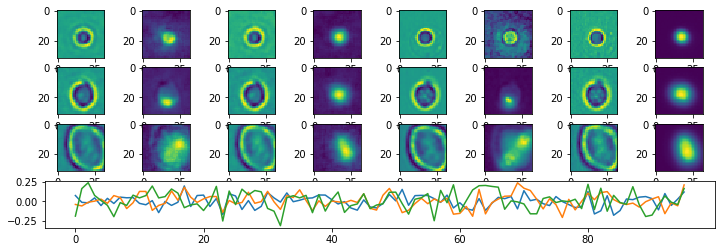

Epoch:  69 Iteration:  0 Loss:  3.4857 0.629984 0.00066781


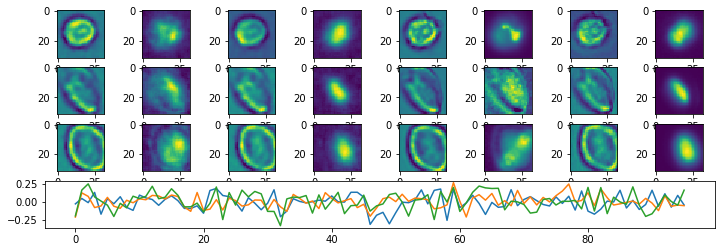

Epoch:  70 Iteration:  0 Loss:  3.4747 0.629978 0.000385016


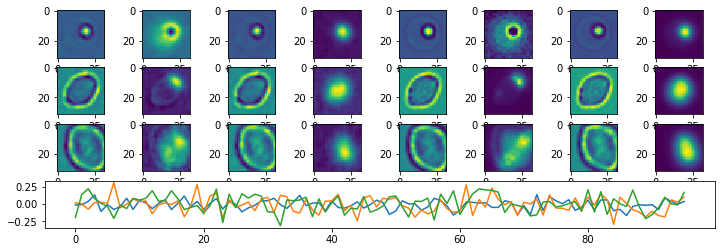

Epoch:  71 Iteration:  0 Loss:  3.43884 0.62996 0.00062412


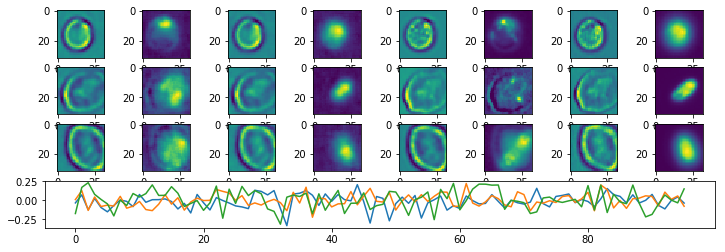

Epoch:  72 Iteration:  0 Loss:  3.45908 0.629969 0.000812083


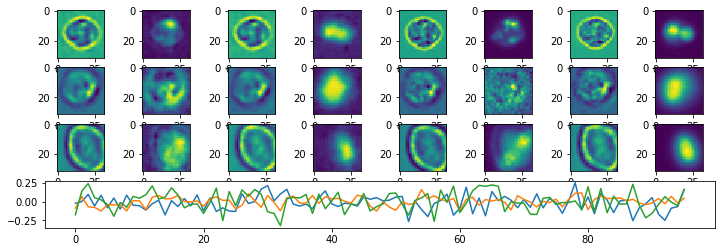

Epoch:  73 Iteration:  0 Loss:  3.45119 0.629967 0.000460118


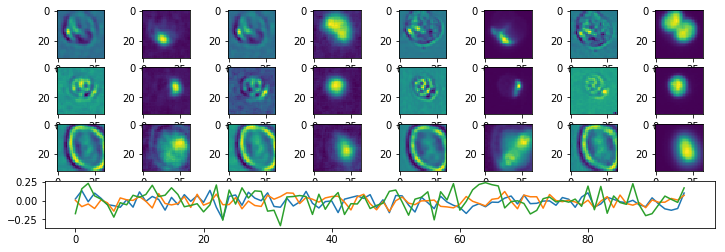

Epoch:  74 Iteration:  0 Loss:  3.43675 0.62996 0.000526369


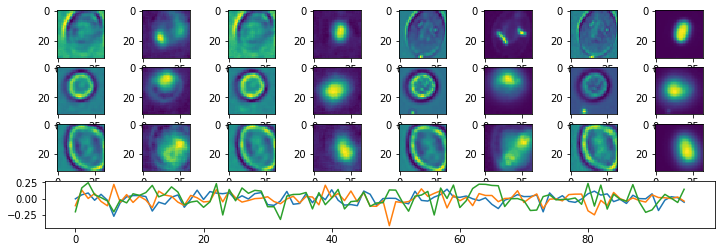

Epoch:  75 Iteration:  0 Loss:  3.39122 0.629935 0.000469387


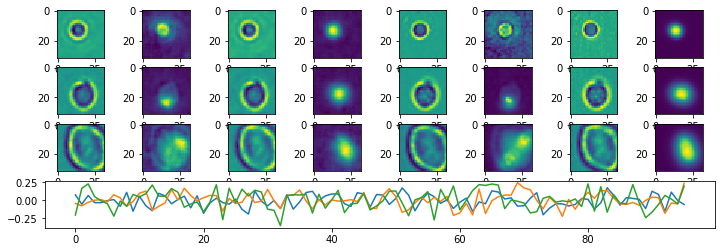

Epoch:  76 Iteration:  0 Loss:  3.41057 0.629946 0.000326961


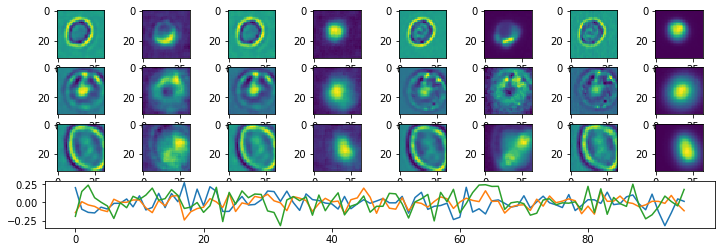

Epoch:  77 Iteration:  0 Loss:  3.41323 0.629947 0.000605196


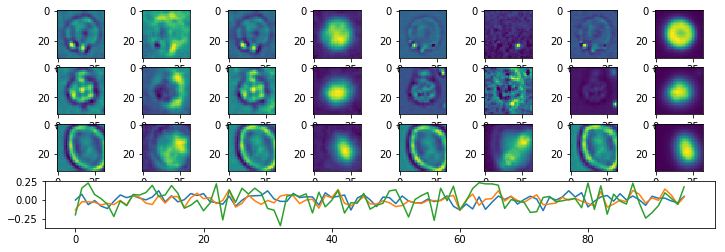

Epoch:  78 Iteration:  0 Loss:  3.40895 0.629945 0.000531375


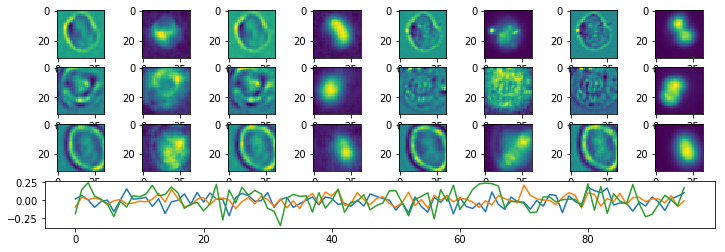

Epoch:  79 Iteration:  0 Loss:  3.38956 0.629934 0.000613272


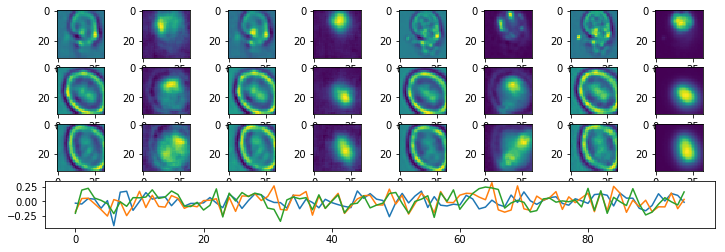

Epoch:  80 Iteration:  0 Loss:  3.35357 0.629917 0.000151366


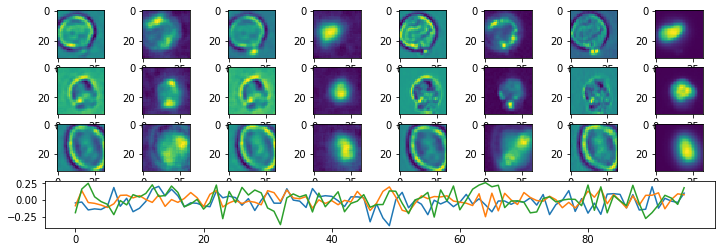

Epoch:  81 Iteration:  0 Loss:  3.34805 0.629913 0.000561804


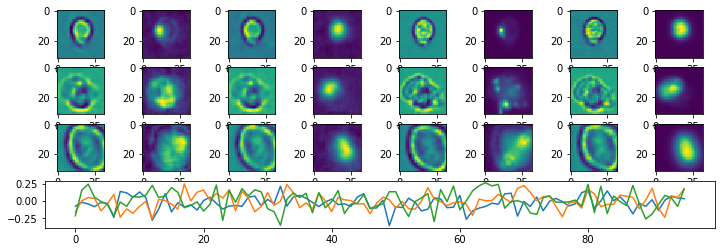

Epoch:  82 Iteration:  0 Loss:  3.3271 0.629903 0.000429839


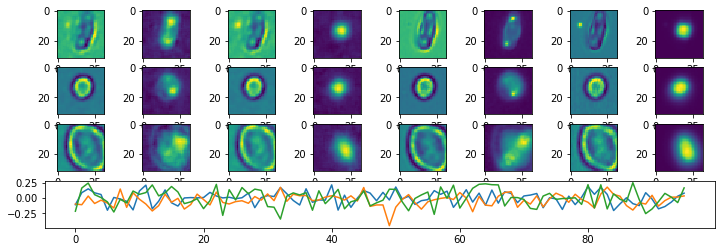

Epoch:  83 Iteration:  0 Loss:  3.32345 0.629901 0.00046134


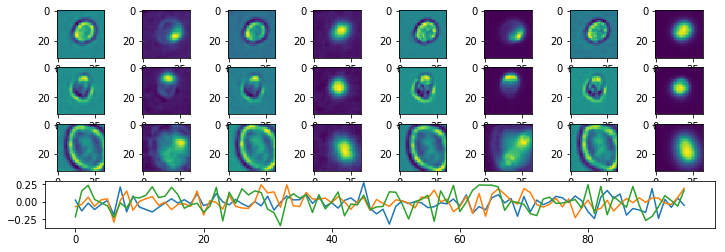

Epoch:  84 Iteration:  0 Loss:  3.30881 0.629894 0.000614583


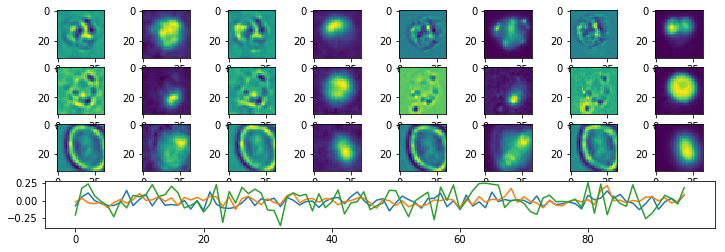

Epoch:  85 Iteration:  0 Loss:  3.25213 0.629865 0.000469029


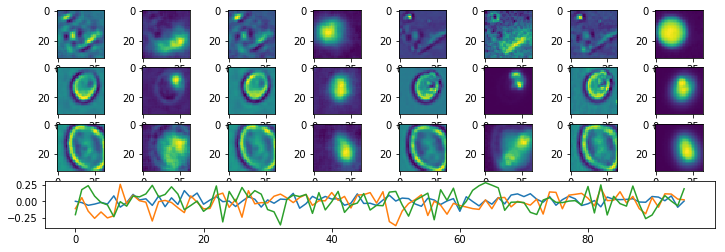

Epoch:  86 Iteration:  0 Loss:  3.28698 0.629883 0.000441611


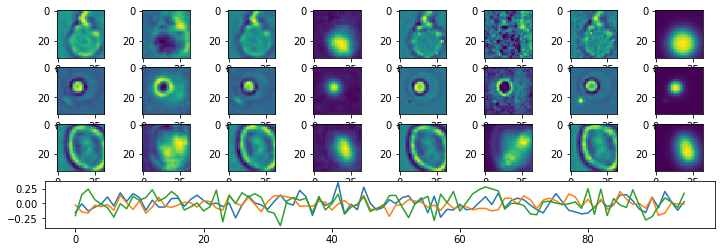

Epoch:  87 Iteration:  0 Loss:  4.08148 0.630293 0.000804186


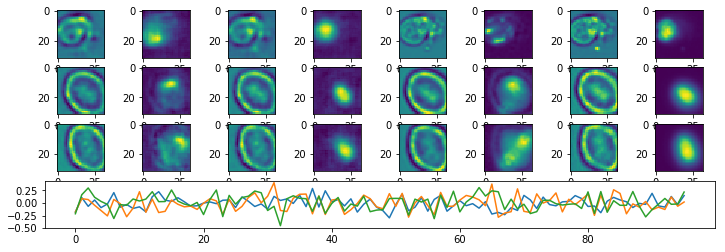

Epoch:  88 Iteration:  0 Loss:  3.64609 0.630069 0.00056389


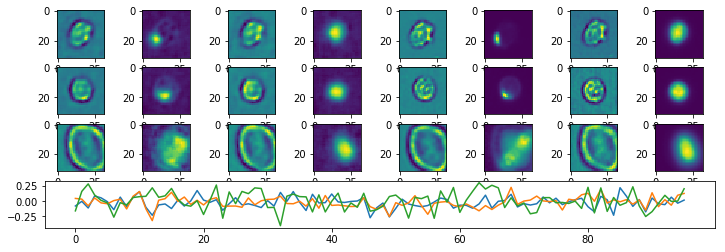

Epoch:  89 Iteration:  0 Loss:  3.47781 0.629981 0.000598729


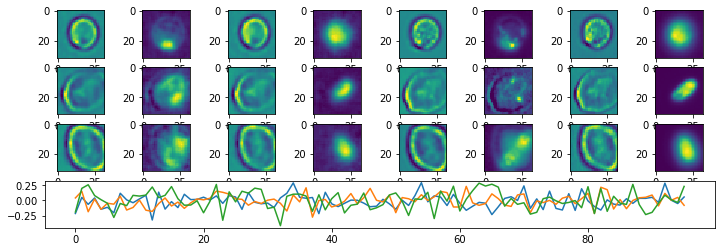

Epoch:  90 Iteration:  0 Loss:  3.43544 0.629959 0.000606328


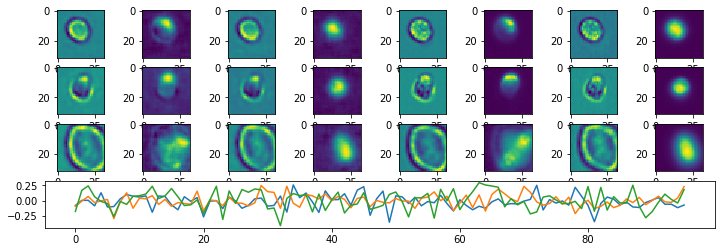

Epoch:  91 Iteration:  0 Loss:  3.40229 0.629942 0.000471234


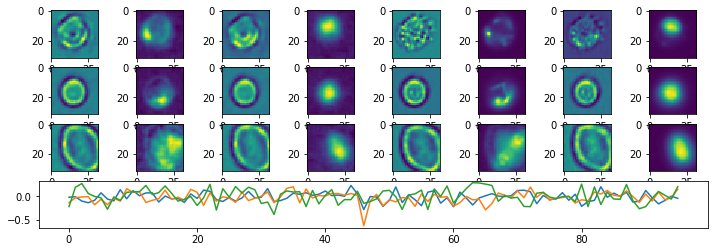

Epoch:  92 Iteration:  0 Loss:  3.3376 0.629909 0.000526488


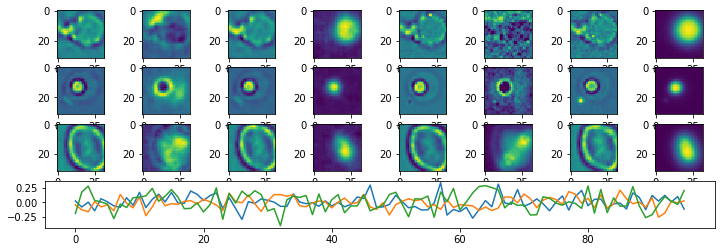

Epoch:  93 Iteration:  0 Loss:  3.32695 0.629904 0.000539243


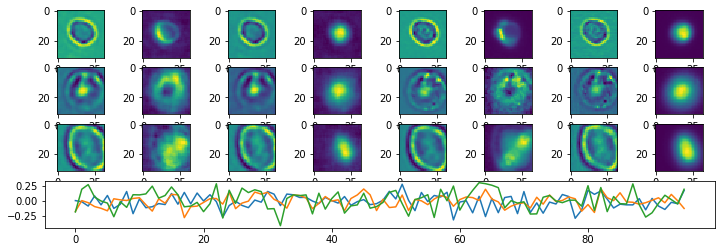

Epoch:  94 Iteration:  0 Loss:  3.31442 0.629897 0.000519454


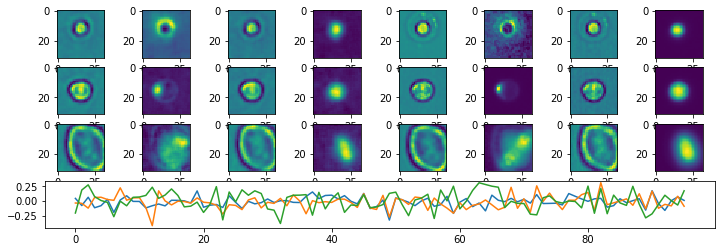

Epoch:  95 Iteration:  0 Loss:  3.32141 0.629901 0.000529736


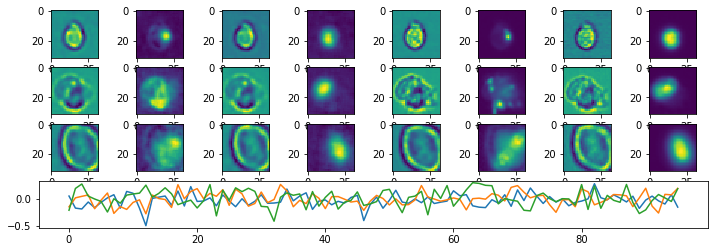

Epoch:  96 Iteration:  0 Loss:  3.27541 0.629877 0.000528276


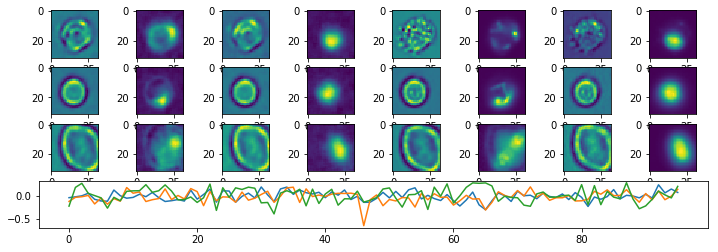

Epoch:  97 Iteration:  0 Loss:  3.29617 0.629888 0.000610411


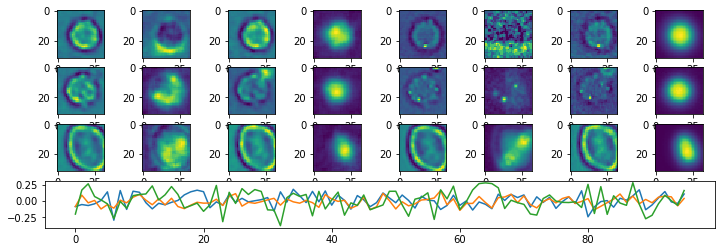

Epoch:  98 Iteration:  0 Loss:  3.26149 0.62987 0.000514001


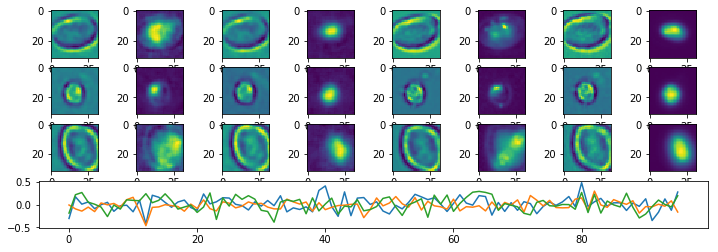

Epoch:  99 Iteration:  0 Loss:  3.23112 0.629855 0.000524521


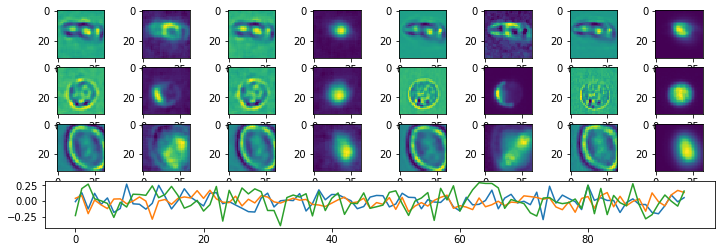

Epoch:  100 Iteration:  0 Loss:  3.20688 0.629841 0.000482351


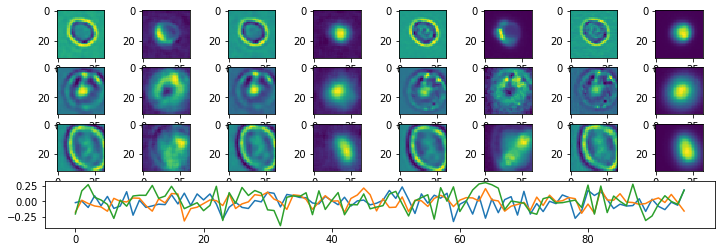

Epoch:  101 Iteration:  0 Loss:  3.20941 0.629843 0.000513047


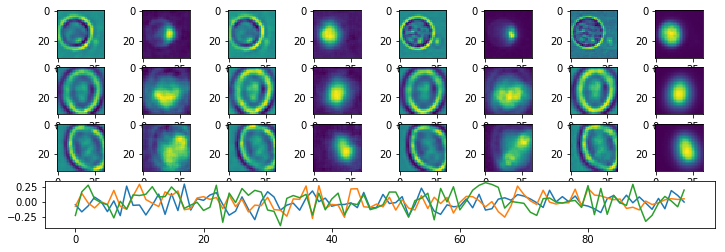

Epoch:  102 Iteration:  0 Loss:  3.23353 0.629855 0.000413388


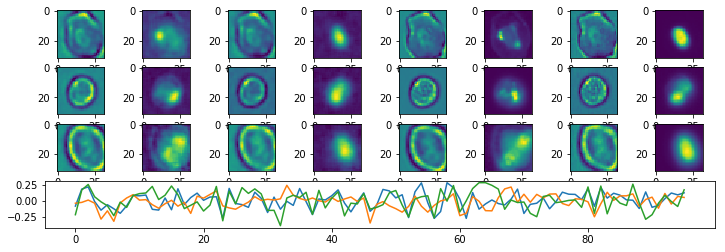

Epoch:  103 Iteration:  0 Loss:  3.23096 0.629854 0.000619918


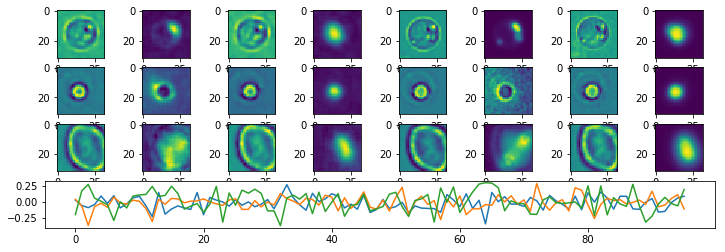

Epoch:  104 Iteration:  0 Loss:  3.2162 0.629846 0.000431269


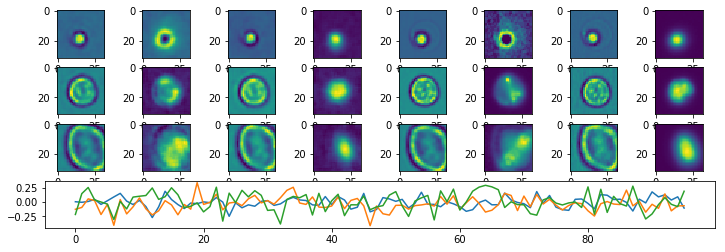

Epoch:  105 Iteration:  0 Loss:  3.18622 0.629831 0.000515312


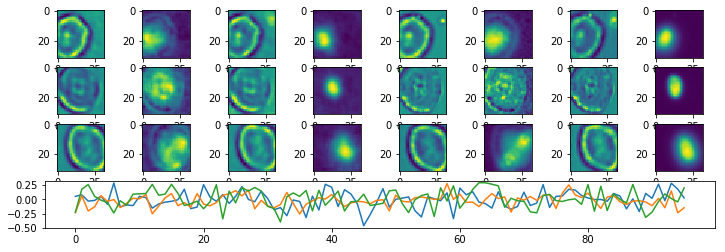

Epoch:  106 Iteration:  0 Loss:  3.17572 0.629826 0.000488967


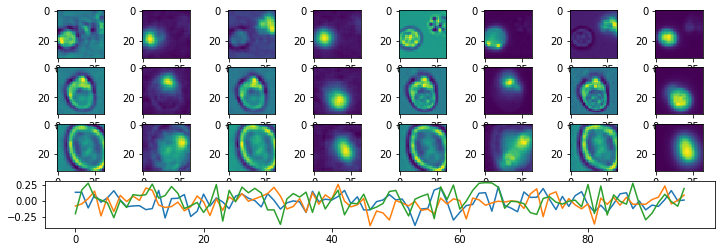

Epoch:  107 Iteration:  0 Loss:  3.18057 0.629829 0.000463516


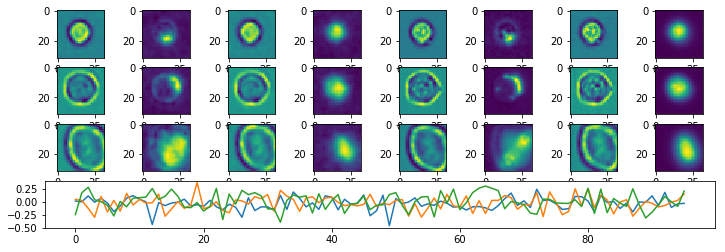

Epoch:  108 Iteration:  0 Loss:  3.18767 0.629832 0.000562191


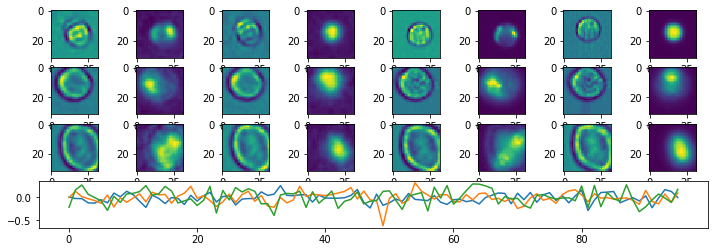

Epoch:  109 Iteration:  0 Loss:  3.19601 0.629836 0.000489861


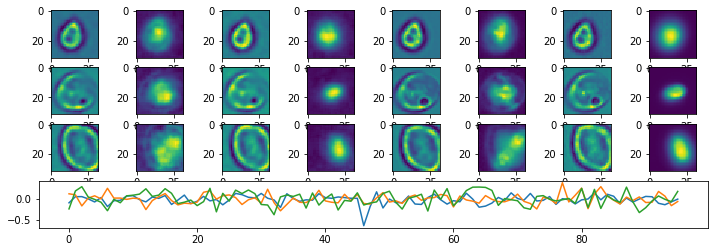

Epoch:  110 Iteration:  0 Loss:  3.14041 0.629808 0.000566185


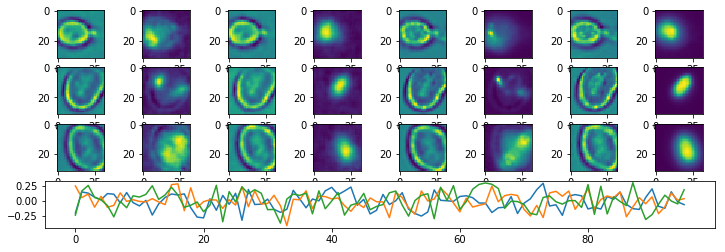

Epoch:  111 Iteration:  0 Loss:  3.16806 0.629822 0.000619262


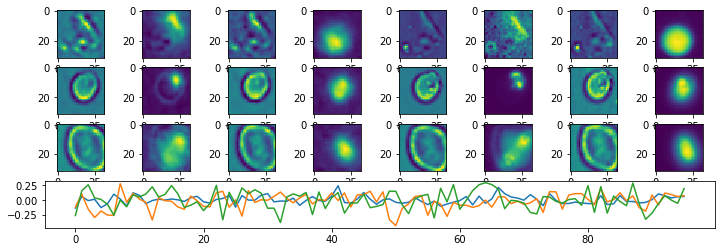

Epoch:  112 Iteration:  0 Loss:  3.11917 0.629797 0.000439733


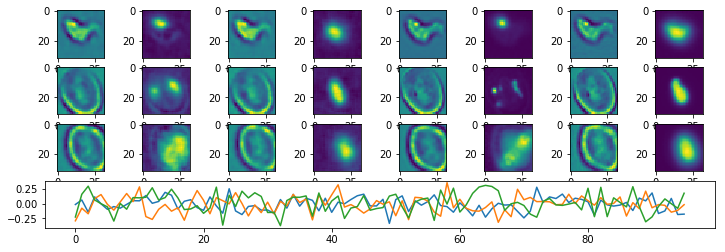

Epoch:  113 Iteration:  0 Loss:  3.13034 0.629803 0.000648379


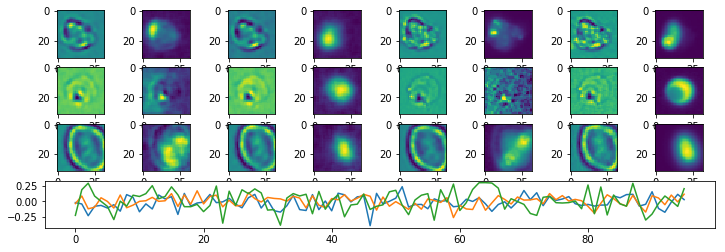

Epoch:  114 Iteration:  0 Loss:  3.13813 0.629806 0.000488371


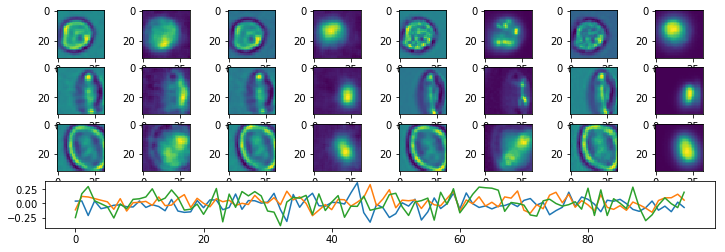

Epoch:  115 Iteration:  0 Loss:  3.11456 0.629795 0.000437438


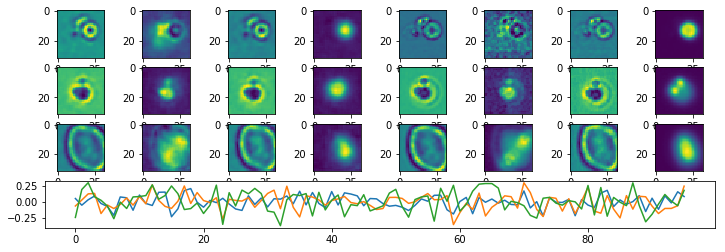

Epoch:  116 Iteration:  0 Loss:  3.08075 0.629777 0.000438601


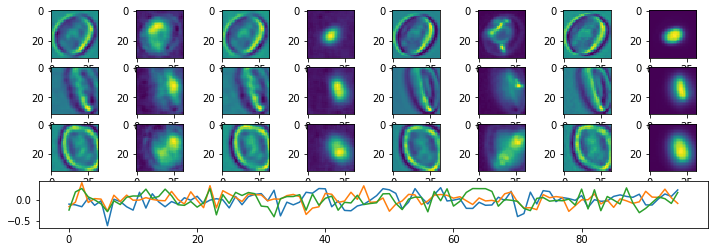

Epoch:  117 Iteration:  0 Loss:  3.14355 0.62981 0.000741929


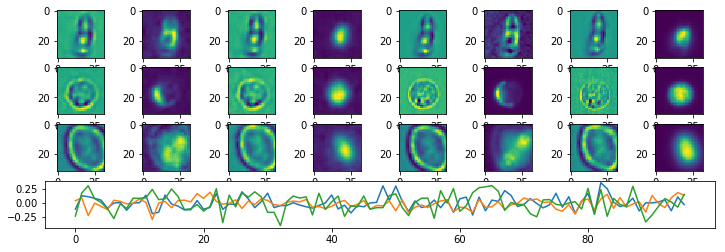

Epoch:  118 Iteration:  0 Loss:  3.12432 0.629799 0.000333101


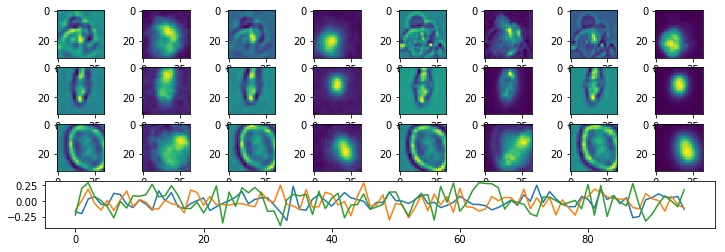

Epoch:  119 Iteration:  0 Loss:  3.11582 0.629795 0.00068441


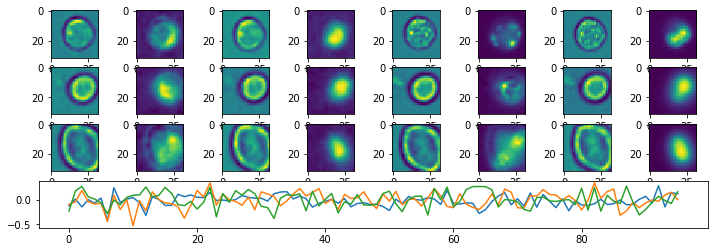

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 96 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-25-LS96"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4